# OpenCV 
Part 2 of the tutorial<br>
Here is a brief overview for openCV done through a course. For more in detail content on certain topics visit <a href='https://docs.opencv.org/4.x/d6/d00/tutorial_py_root.html'>OpenCV-Python Tutorials</a> or these could also be <a href = 'https://pyimagesearch.com/category/opencv/'>helpful</a>

In [8]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

## Morphological Operations
Tool for extracting image component that are useful for representation and description of object shape. Performed generally on binary or black-white images<br><br>
Same thing as the basic operations in openCV. These operations are done to reduce noise in the image

<b>Closing</b> is basically dilation followed by erosion of the object<br>
<b>Opening</b> is basically erosion followed by dilation

In [32]:
img = cv.imread('./Resources/Photos/cat.jpg',0)  # reading as gray scale
cv.imshow('original image',img)

ret,th1 = cv.threshold(img,125,255,cv.THRESH_BINARY)
cv.imshow('thresholded image',th1)

# create kernel
kernel = np.ones((3,3),np.uint8)
dilation = cv.dilate(th1,kernel,iterations = 2)
cv.imshow('dilated image',dilation)

eroded = cv.erode(th1,kernel)
cv.imshow('eroded image',eroded)

opening = cv.morphologyEx(th1,cv.MORPH_OPEN,kernel)
cv.imshow('opening image',opening)

closing = cv.morphologyEx(th1,cv.MORPH_CLOSE,kernel)
cv.imshow('closing image',closing)

cv.waitKey(0)
cv.destroyAllWindows()

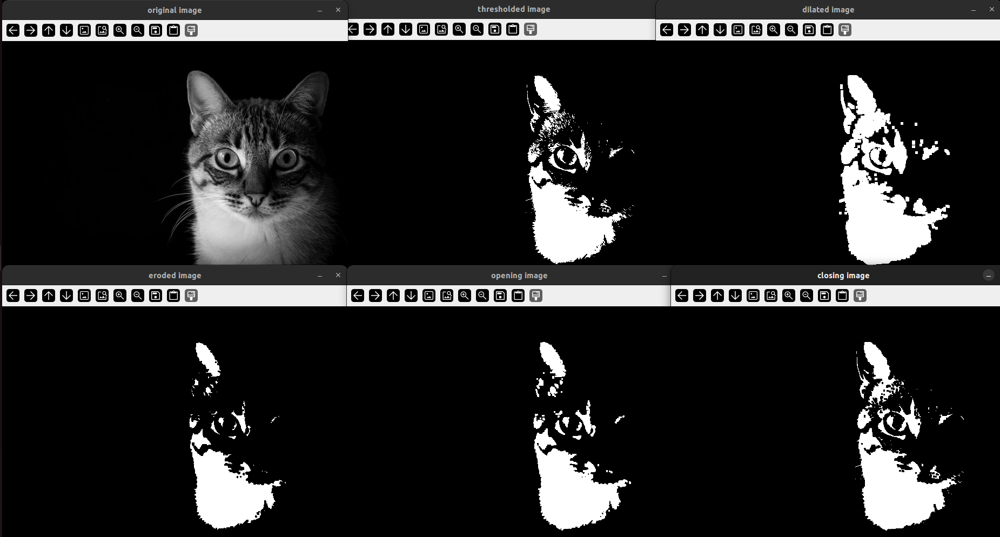

## Contour Detection
Contours are basically boundaries of objects i.e the line or curve that joins the continous points on the boundary of an object. They aren't same as edges from mathematical pov. 

To find contours we use find contours method which returns the contours and hierarchies. This method looks at the structuring element here the edges that were found in the image and returns two values. <u><b>contours</b></u> is a list of all the coordinates of the contours that were found in the image and <u><b>hierarchies</b></u> is the hierachial representaion of contours<br>
`cv.findContours(img, mode, method, contours= ,hierarchy= ,)` the img is the edges, mode is the mode in which we want to find the contours an return contours. We use either `cv.RETR_TREE` if we want all the hierarchial contors or `cv.RETR_EXTERNAL` if want only the external contours or `cv.RETR_LIST` if we want all the contours in the image. Method is the contour approximation method `cv.CHAIN_APPROX_NONE` does nothing and returns all the contours, `cv.CHAIN_APPROX_SIMPLE` compresses all the contours that are returned into simple one that makes most sense eg if we have line in an img the NONE would give all points of that line while SIMPLE would take all points in the line and compress into two end points of the line as it makes sense since line is defined by a start and an end point.

In [2]:
img = cv.imread('./Resources/Photos/cats.jpg')

# convert to gray scale
gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)

# bluring the image
blur = cv.GaussianBlur(gray,(3,3),cv.BORDER_DEFAULT)

# getting edges of img using canny edge detector
edges = cv.Canny(blur,125,175)
cv.imshow('edges',edges)

# finding contours
contours, hierarchies = cv.findContours(edges, cv.RETR_LIST, cv.CHAIN_APPROX_NONE)

# since contour is a list we can find the no.of contours 
print(f'{len(contours)} is the no.of contours in the list')
cv.imshow('contours',edges)

cv.waitKey(0)
cv.destroyAllWindows()

778 is the no.of contours in the list


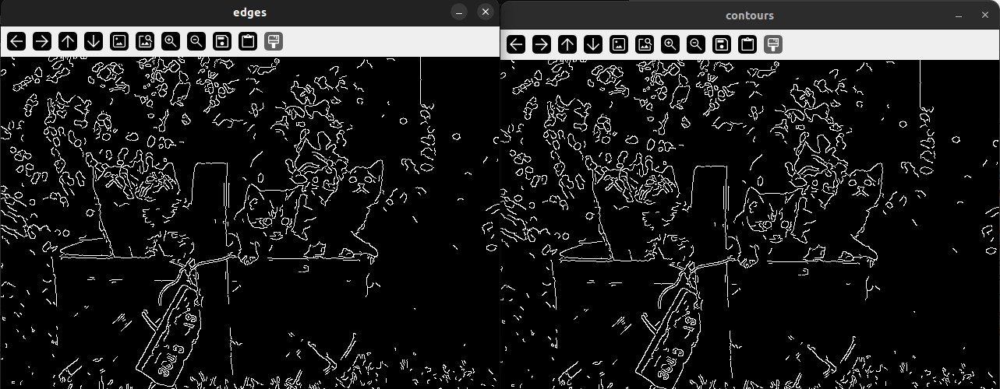<br><br>
There is another method to find contours where we use a thresholded image to create the contours

<b><u>Thresholding</u></b> is used to segment an image into two regions: foreground and background. It operates on pixel intensity values. It <u>must always take in a grey scale image</u><br><br>

`cv.threshold(grey img src, threshold, maxval, type)` Compares each pixel's intensity to a threshold value (125 in this case).If the pixel intensity is greater than the threshold, it is set to the maximum value (255). Otherwise, it is set to 0. The different types yield different results such as:

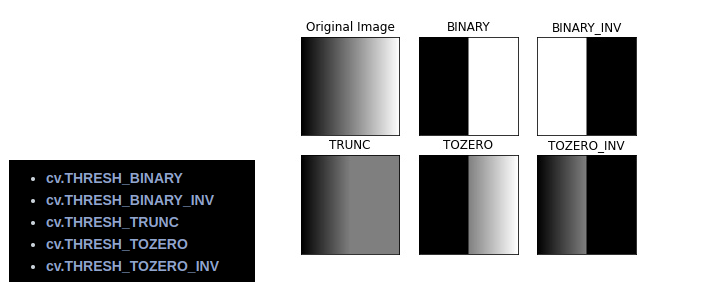<br>
Then there's adaptive thresholding which you can read up on <a href='https://docs.opencv.org/4.x/d7/d4d/tutorial_py_thresholding.html'>here</a>

In [4]:
ret, thresh = cv.threshold(gray, 125,255,cv.THRESH_BINARY)
cv.imshow('threshold',thresh)

contours, hierarchies = cv.findContours(thresh, cv.RETR_LIST, cv.CHAIN_APPROX_NONE)
print(f'{len(contours)} is the no.of contours present in the list')

cv.waitKey(0)
cv.destroyAllWindows()

839 is the no.of contours present in the list


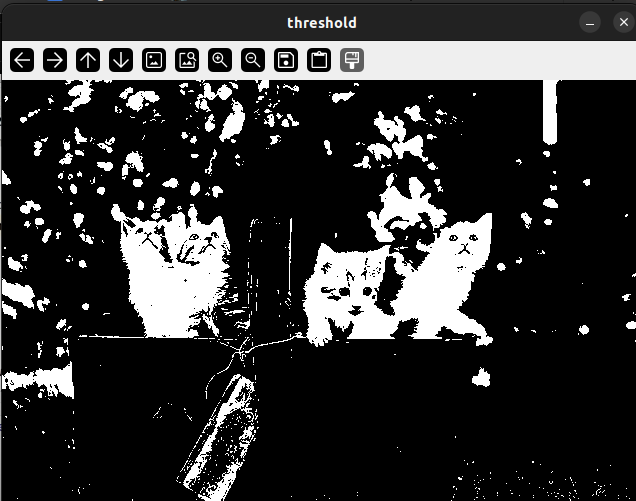

To see the contours of an image we have to do it by drawing over the image using :<br>
`cv.drawContours(image to draw over, contours, contours index, color, thickness)` contours is the list of contours found using `cv.findContours()` and contours index is the number of contours we want in the image (-1 means all the contours), colors are in BGR (blue-green-red) format<br><br>

Instead of doing the way below we could also just do:<br>
`contour_img = cv.drawContours(image to draw over, contours, contours index, color, thickness)` <br>
in order to be more consistent in the way it had been done before here and then show this new contour_img in the GUI window

In [5]:
# creating a blank image
blank = np.zeros(img.shape,dtype='uint8')   # image.shape returns (height,width,channels)

# drawing the contours over the blank image 
cv.drawContours(blank,contours,-1,(0,0,255),1)
cv.imshow('contours',blank)

cv.waitKey(0)
cv.destroyAllWindows()

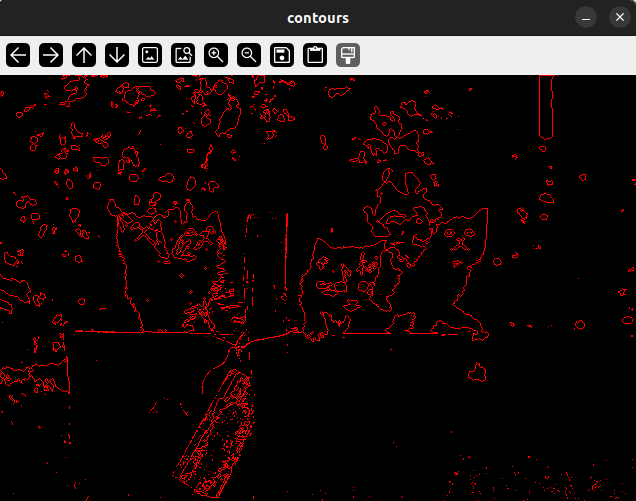

## Color Spaces
A color space is a way to organize colors in an image so they can be represented and reproduced consistently eg. BGR: default color space of openCV is rgb, grey scale is also a color space

In [6]:
img = cv.imread('./Resources/Photos/park.jpg')

# BGR to gray scale
gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
#gray_img = cv.imread('./Resources/Photos/cats.jpg', cv.IMREAD_GRAYSCALE)   # directly loads image as grayscale

# BGR to HSV or Hue saturation Value
hsv = cv.cvtColor(img,cv.COLOR_BGR2HSV)
cv.imshow('hsv image',hsv)

# BGR to LAB or l*a*b
lab = cv.cvtColor(img,cv.COLOR_BGR2LAB)
cv.imshow('lab image',lab)

cv.waitKey(0)
cv.destroyAllWindows()

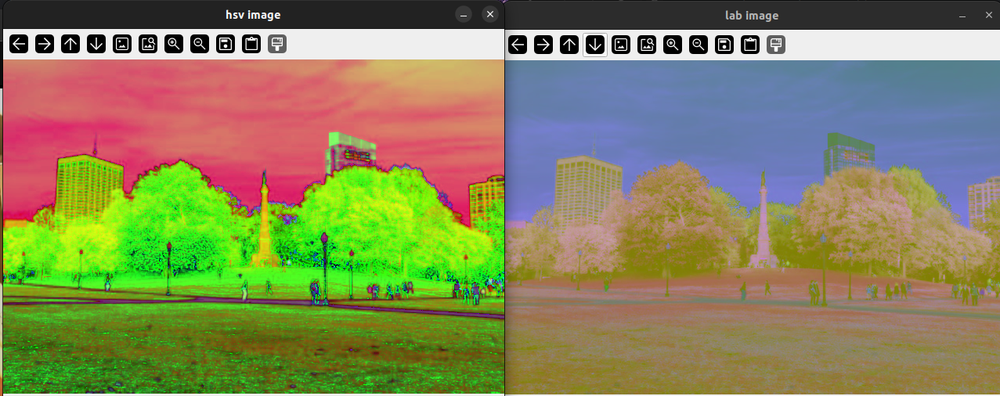

As said that openCV's default color space is BGR or blue-green-red but outside openCV RGB format is used which is the inverse of BGR hence if we try opening the image in a python library that is not openCV we will likely see a inversion of colors as seen by matplotlib below

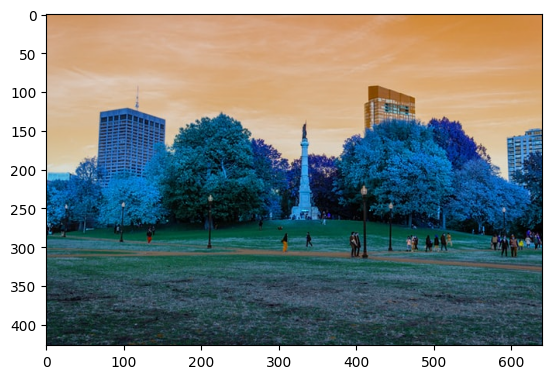

In [9]:
plt.imshow(img)

The image has inverted color scheme because matplot considers the image as RGB format but since the image is loaded in through openCV, its loaded in BGR format

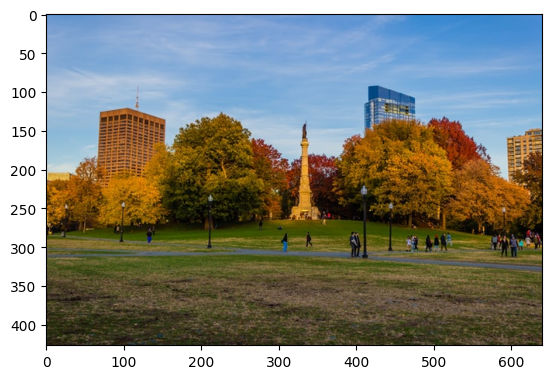

In [10]:
# converting BGR to the RGB format
rgb = cv.cvtColor(img,cv.COLOR_BGR2RGB)
plt.imshow(rgb)

Note: IT IS NOT POSSIBLE TO CONVERT HSV IMAGE TO GRAY SCALE DIRECTLY AND VICE VERSA

## Color Channels
A colored image consists of channels e.g a BGR image consists of three channels blue-green-red. We can split an image into it's respective color channels using `cv.split(img)` returning the intensity of color as in grayscale images


In [11]:
img = cv.imread('./Resources/Photos/park.jpg')

# splitting the color channels
b,g,r = cv.split(img)
cv.imshow('blue',b)
cv.imshow('green',g)
cv.imshow('red',r)

print(f'shape of original image {img.shape}')   # prints (height,width,channel)
print(f'shape of blue image {b.shape}')
print(f'shape of green image {g.shape}')
print(f'shape of red image {r.shape}')

cv.waitKey(0)
cv.destroyAllWindows()

shape of original image (427, 640, 3)
shape of blue image (427, 640)
shape of green image (427, 640)
shape of red image (427, 640)


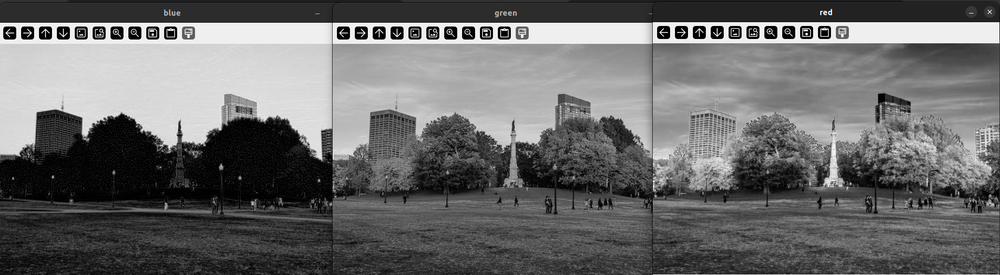

The lighter region shows that the concentration of those pixels in that are is higher and the darker region shows that there is lower concentration of the pixels in that region 

Also the shape of the b,g and r have only (height,width) displayed since the channel component of the shape in them is 1.
Below is a merged image of the b,g and r color channels that were split previously using `cv.merge([the color channels])`

In [12]:
merged = cv.merge([b,g,r])
cv.imshow('merged image',merged)

cv.waitKey(0)
cv.destroyWindow('merged image')

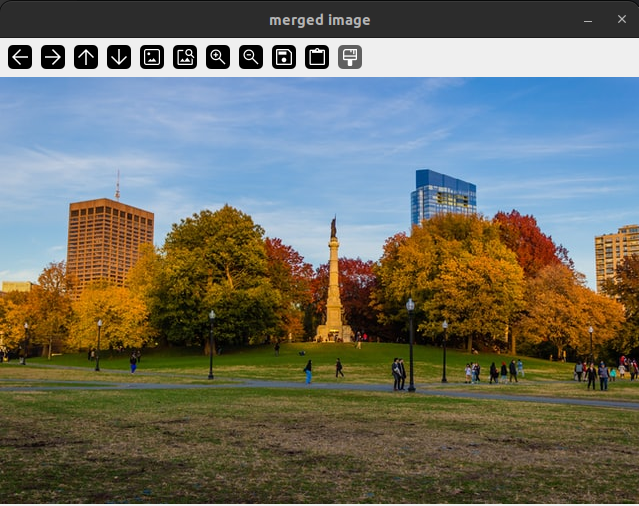<br><br>
to actually see the color of the image in the GUI window instead of the grey scale (shows intensity of pixels) images previously we have to reconstruct the image as follows 

In [13]:
# creating a blank image
blank = np.zeros(img.shape[:2], dtype= 'uint8')

# printing the color channels
blue = cv.merge([b,blank,blank])  # only the blue color channel gets painted and the other color channels are black because of blank
green = cv.merge([blank,g,blank])
red = cv.merge([blank,blank,r])

cv.imshow('blue',blue)
cv.imshow('green',green)
cv.imshow('red',red)

cv.waitKey(0)
cv.destroyAllWindows()

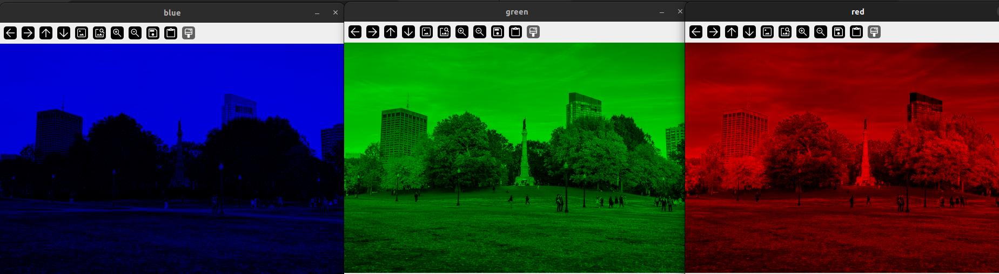

## Blurring Techniques
Blurring is done when the image has a lot of noise. 

In blurring a kernel ( kernel meaning the size of window used for blur) size is chosen which is a 2D tuple (width,height) where (3,3) means a 3x3 matrix defining the area to calculate the blur. To increae the blur we can increase the kernel size and borderType to handle image edges. The value of kernel size must always be <b> positive and odd </b><br>

<img src="./Resources/gaussian_blur.jpeg">

Blur is applied to the center pixel as a result of its surrounding pixels. The kernel is applied over the input image like below and the pixel of the image that corresponds to the center pixel in the kernel is blurred<br>
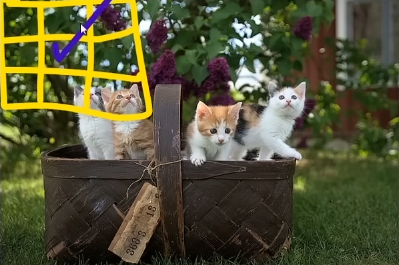<br>
<b>Average Blur</b>  is where the pixel intensity of the center pixel in the kernel is calculated as the average of surronding pixel intensity. `cv.blur(img,(ksize or kernel size))`<br><br>
<b>Gaussian Blur</b> is where each surrounding pixel is given a weight using gaussian function. And the average of the product of the weight gives the value of center pixel. `cv.GaussianBlur(img,(kernel size),standard deviation in x-direction)`<br><br>
<b>Median Blur</b> same as average blur but instead of finding the average the median of the surrounding pixel intesity is taken and set as the intensity of the center pixel. `cv.medianBlur(img, ksize)`. See that the ksize or <u>kernel size isn't a 2D tuple but just a integer</u>. This is because openCV already assumes that the kernel is a 2D tuple of the ksize value. It is NOT RECOMMENEDED to use high kernel size like 7 or 5 in some cases as well.<br><br>
<b>Bilateral Blur</b> it applies blurring but retains the edges (like the ones in canny edges) of the image. Pixels that are close in spatial position and have similar colors are averaged. Pixels with very different colors (i.e., edges) are preserved. `cv.bilateralFilter(img, diameter of pixel neighborhood, sigmaColor, sigmaSpace)` diameter of the pixel neighborhood specifies the size of the area considered for filtering around each pixel. Larger values include more surrounding pixels in the computation. Higher value of sigmaColor means larger number of colors in the neighborhood will be considered in the blur and larger value of sigmaSpace means that pixels further out from central pixel will influence the blurring computation for the center pixel.

In [14]:
img = cv.imread('./Resources/Photos/cats.jpg')

# Averaging        
average = cv.blur(img,(3,3))
cv.imshow('average blur',average)

# Gaussian Blur
gauss = cv.GaussianBlur(img,(3,3),0)
cv.imshow('gaussian blur',gauss)

# Median Blur
median =cv.medianBlur(img,3)   # see that the ksize isn't a 2D tuple
cv.imshow('median blur',median)

# Bilateral Blur
bilateral = cv.bilateralFilter(img, 5, 15, 15)
cv.imshow('bilateral blur',bilateral)

cv.waitKey(0)
cv.destroyAllWindows()

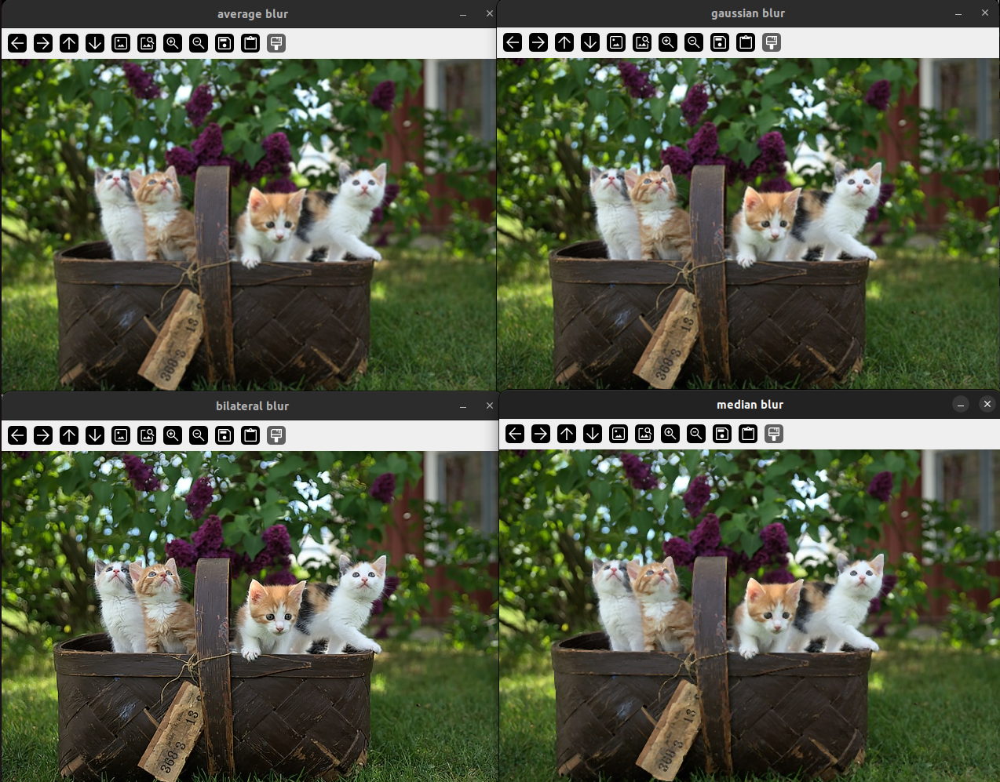

## BITWISE Operators
they are used a lot in masking. They operate the same way in binary manner i.e a pixel is turned OFF if it has value 0 and is turned ON if it has value 1<br>
`copy_blank = blank.copy()` creates a deep copy i.e any changes to copy_blank will not affect blank while `copy_blank = blank` creates a shallow copy where any changes to copy_blank will also affect blank<br><br>
<ol><li><code>cv.bitwise_and(img1,img2)</code> creates and intersection between image 1 and image 2 (just how it works in gates kinda)</li>
<li><code>cv.bitwise_or(img1,img2)</code> is basically the union between the two images or non-intersecting region</li>
<li><code>cv.bitwise_xor(img1,img2)</code> returns the non-intersecting region between the two images</li>
<li><code>cv.bitwise_not(img1)</code> inverts the binary color in the image</li>

In [15]:
# creating blank variable
blank = np.zeros((400,400), dtype='uint8')

# creating rectangle and a circle
rectangle = cv.rectangle(blank.copy(),(30,30),(370,370), 255, -1)    # since its a binary image only one parameter for the color
circle = cv.circle(blank.copy(), (200,200),200,255,-1)     # thickness is -1 to fill in the image
cv.imshow('rectangle',rectangle)
cv.imshow('circle', circle)

# BITWISE AND
bitwise_and = cv.bitwise_and(rectangle,circle)
cv.imshow('bitwise and',bitwise_and)

# BITWISE OR
bitwise_or = cv.bitwise_or(rectangle,circle)
cv.imshow('bitwise or',bitwise_or)

# BITWISE XOR
bitwise_xor = cv.bitwise_xor(rectangle,circle) 
cv.imshow('bitwise exor',bitwise_xor)

# BITWISE NOT
bitwise_not = cv.bitwise_not(circle)
cv.imshow('bitwise not',bitwise_not)

cv.waitKey(0)
cv.destroyAllWindows()

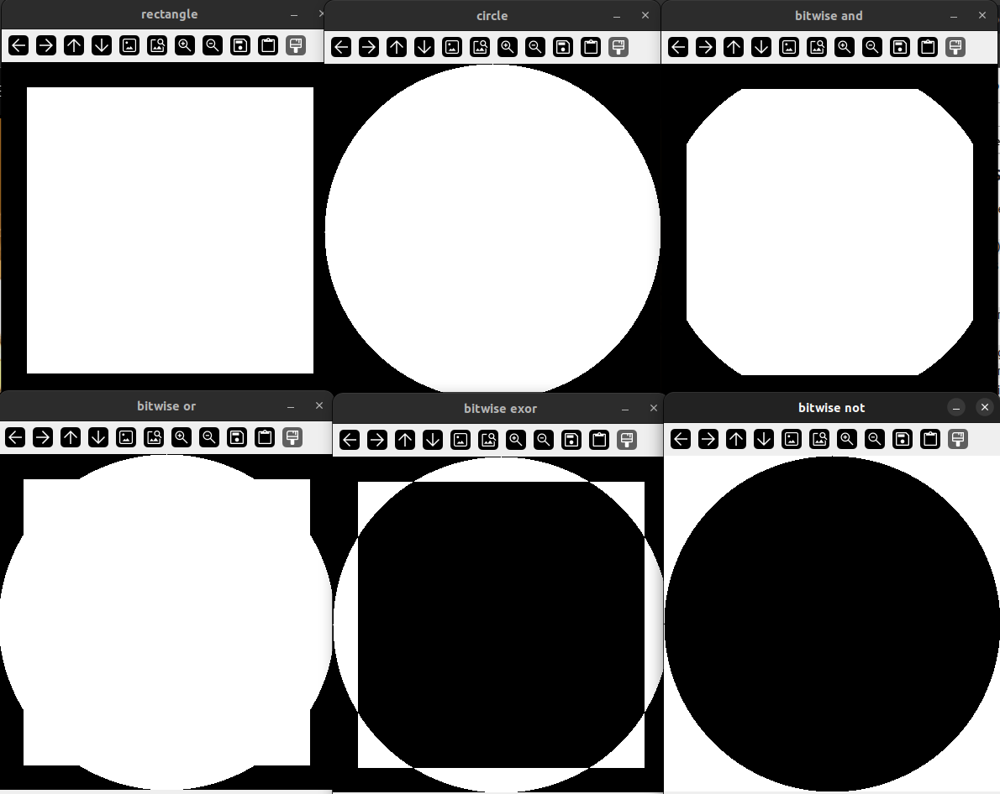

## Masking
masking is a technique used to isolate specific regions of an image. It allows you to focus your operations on only the parts of the image that you're interested in. A MASK is a binary image (black and white pixels) that HAS SAME DIMENSION AS THE ORIGINAL IMAGE where the white pixels represent area we want to keep and dark pixels represent the are to be discarded.

`cv.bitwise_and(img,img,mask=mask)` a bitwise and operation between img and itself where the mask parameter specifies which part of the image to be proccessed in the bitwise operation. if pixel value in mask is 0 it is excluded

In [18]:
img = cv.imread('./Resources/Photos/cats 2.jpg')
cv.imshow('original img',img)

# creating a blank image
blank = np.zeros(img.shape[:2], dtype = 'uint8')

# creating a mask
mask = cv.circle(blank,(img.shape[1]//2,img.shape[0]//2),100,255,-1)
cv.imshow('mask',mask)

# masked image
masked = cv.bitwise_and(img,img,mask=mask)
cv.imshow('masked image',masked)

cv.waitKey(0)
cv.destroyAllWindows()

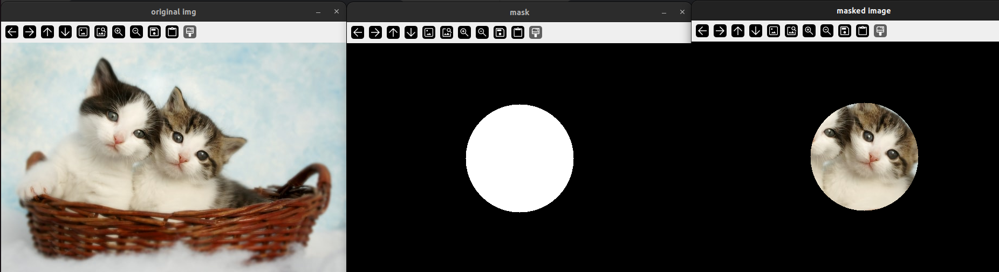

## Histogram Computation
Histogram allows to visualize the distribution of pixel intensities in an image plotted where x-axis represents the intensity level and the y-axis represents the number of pixels with that intensity level; it provides insight into an image's brightness, contrast and pixel distribution in the image

`cv.calcHist([image list], [channels], mask, [histSize],[range list])` <b>IMAGES MUST BE PASSED AS A LIST</b>. channels are index representing the channels in the image ( in gray scale its only 1 hence indexed as 0 while in bgr images there are 3 hence would be [i] where i is parsed through loops till 2 ). Mask if any <b>MUST HAVE ONLY ONE CHANNEL</b>  and histSize is basically the number of bins with each bin corresponding range of intensity value ( here since the intensity value is [0,256] and the number of bins are 256 hence each bin corresponds to one intensity value ). Range is the range of intensity value to be considered and it must be in LIST. The range list goes to 256 to ensure the edge cases<br><br>

The function returns a 256x1 array, where:
<li>The index corresponds to the intensity value (0 to 255).
<li>The value at each index corresponds to the number of pixels in the image with that intensity<br><br>
<code>plt.figure()</code> create a new figure, allowing you to configure and manage multiple plots independently. Specify size, background color, DPI (dots per inch), and other properties for the figure. Manage subplots and organize them neatly within a figure.

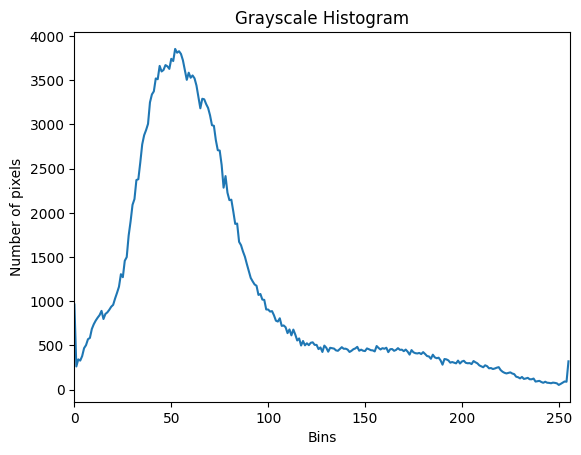

In [19]:
# Load an image in grayscale
gray = cv.imread('./Resources/Photos/cats.jpg', cv.IMREAD_GRAYSCALE)
cv.imshow('gray scale image',gray)

# gray scale histogram
gray_hist = cv.calcHist([gray],[0],None,[256],[0,256])
plt.figure()
plt.title('Grayscale Histogram')
plt.xlabel('Bins')
plt.ylabel('Number of pixels')
plt.plot(gray_hist)
plt.xlim([0,256])
plt.show()

cv.waitKey(0)
cv.destroyAllWindows()

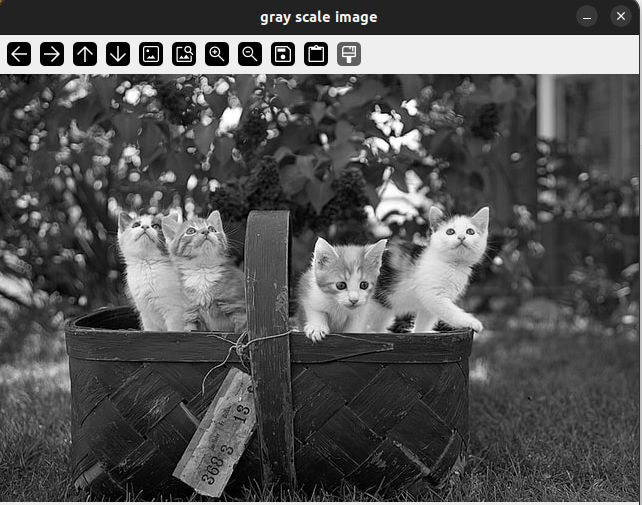<br><br>
From histogram it can be interpreted that there are around 4k pixels with intenstiy around 50'ish (from bins). This can be intuitively seen as the major part of the image is dark<br><br>

Seeing histogram with a mask

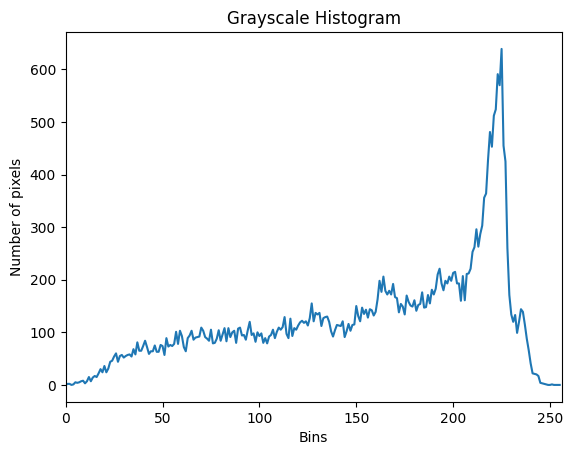

In [20]:
img = cv.imread('./Resources/Photos/cats 2.jpg')
cv.imshow('original img',img)

# using the previous mask
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
cv.imshow('gray scale image',gray)

# creating a mask
circle = cv.circle(blank,(img.shape[1]//2,img.shape[0]//2),100,255,-1)
mask = cv.bitwise_and(gray,gray, mask = circle)
cv.imshow('mask',mask)

# gray scale histogram
gray_hist = cv.calcHist([gray],[0],mask,[256],[0,256])
plt.figure()
plt.title('Grayscale Histogram')
plt.xlabel('Bins')
plt.ylabel('Number of pixels')
plt.plot(gray_hist)
plt.xlim([0,256])
plt.show()

cv.waitKey(0)
cv.destroyAllWindows()

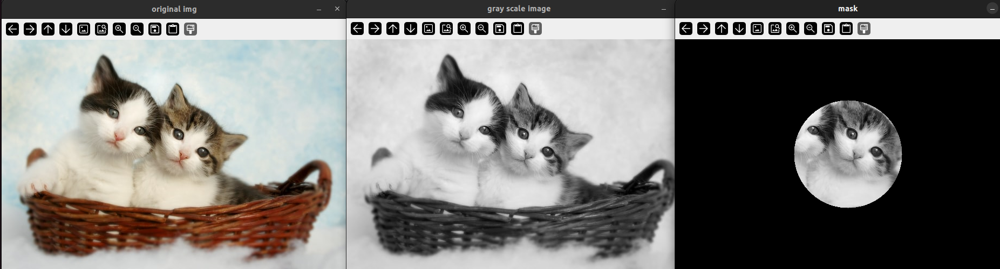<br><br>
Trying to compute it by sending the masked image to gray scale conversion and then moving on with histogram would provide a wildly different and inaccurate result. THE ONE BELOW IS WRONG

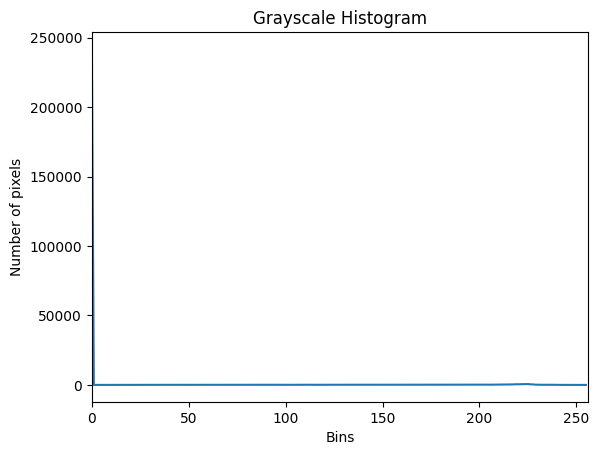

In [21]:
# using the previous mask
gray = cv.cvtColor(masked, cv.COLOR_BGR2GRAY)
cv.imshow('masked gray scale image',gray)

# gray scale histogram
gray_hist = cv.calcHist([gray],[0],None,[256],[0,256])
plt.figure()
plt.title('Grayscale Histogram')
plt.xlabel('Bins')
plt.ylabel('Number of pixels')
plt.plot(gray_hist)
plt.xlim([0,256])
plt.show()

cv.waitKey(0)
cv.destroyAllWindows()

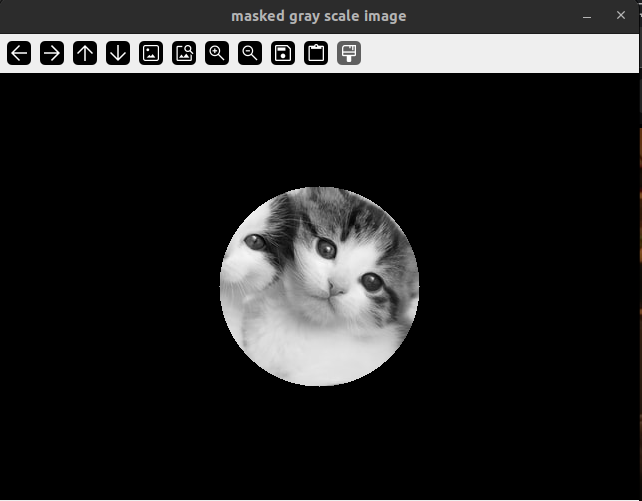<br><br>
For computing a color histogram we define a tuple of colors and loop over them using enumerate as shown below

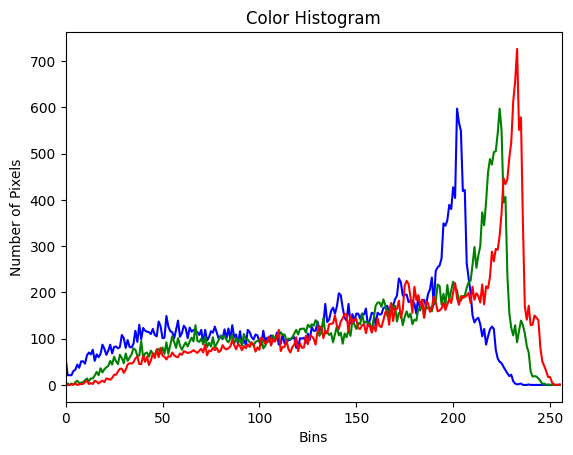

In [22]:
# Read a color image
img = cv.imread('./Resources/Photos/cats 2.jpg')

blank = np.zeros(img.shape[:2], dtype = 'uint8')
circle = cv.circle(blank,(img.shape[1]//2,img.shape[0]//2),100,255,-1)
mask = cv.bitwise_and(img,img, mask = circle)
cv.imshow('mask',mask)


# Calculate histograms for each channel
colors = ('b', 'g', 'r')  # Channel order: Blue, Green, Red
for i, color in enumerate(colors):  # loops over the iterable (here tuple) giving i the index and color the element value
    hist = cv.calcHist([img], [i], circle, [256], [0, 256])  # Histogram for channel i
    plt.plot(hist, color=color)  #plots the data points provided in hist on a graph and color specifies the color of the line
    plt.title('Color Histogram')
    plt.xlabel('Bins')
    plt.ylabel('Number of Pixels')

plt.xlim([0, 256])
plt.show()

cv.waitKey(0)
cv.destroyAllWindows()

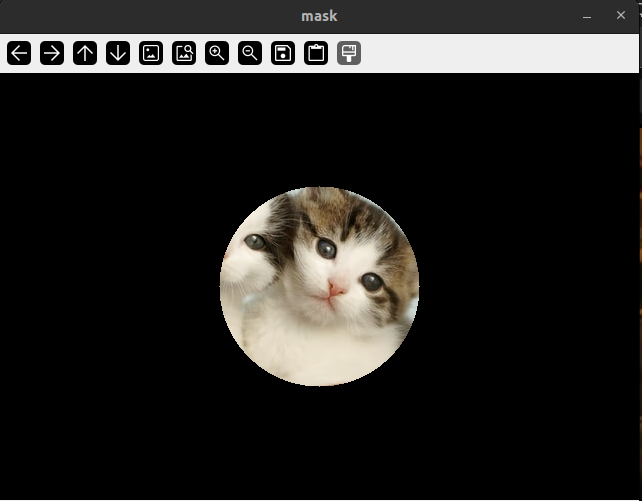

## Thresholding
It is binarization of an image i.e pixels are either 0/ black or 255/ white. It operates on pixel intensity values. It <b>must always take in a grey scale image</b>

A threshold value is chosen and each pixel is compared with that if pixel intensity is less then we set that pixel value to 0 and if more then set to 255

### Simple thresholding
`cv.threshold(img, threshold value, max value, threshold type) ` max value defines that if the pixel value is greater than threshold value what do we want to set it to ( here since we want to binarize the image we set it to 255). <br><br>

This returns thresh and threshold where thresh is the binarized or thresholded image and threshold which is the threshold value passed in the function

In [23]:
gray = cv.imread('./Resources/Photos/cats.jpg',cv.IMREAD_GRAYSCALE)
cv.imshow('gray scale image',gray)

# simple thresholding
threshold, thresh = cv.threshold(gray, 125, 255, cv.THRESH_BINARY)
cv.imshow('simple thresholded image', thresh)

# inverse thresholded image
threshold, thresh_inverse = cv.threshold(gray, 125, 255, cv.THRESH_BINARY_INV)
cv.imshow('simple inverse thresholded image', thresh_inverse)

cv.waitKey(0)
cv.destroyAllWindows()

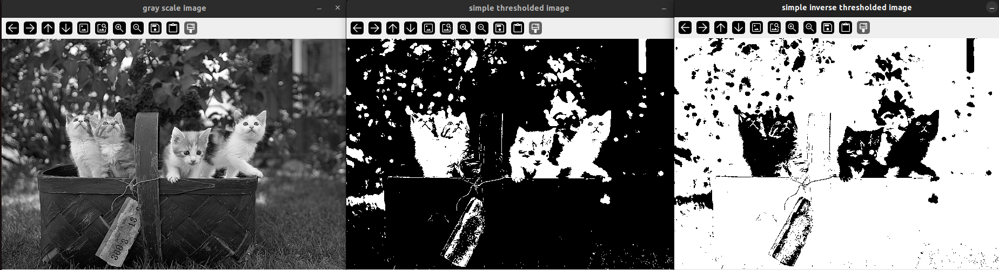<br>
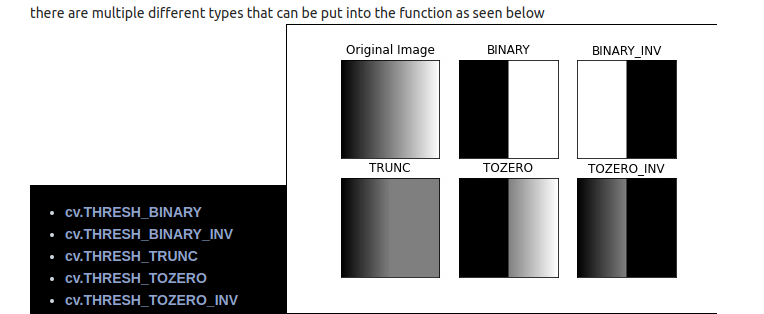

### Adaptive Thresholding
As seen in simple thresholding we have to manually provide threshold value and each value results in a different image this might not work in advanced cases hence we use adaptive thresholding, In adaptive thresholding the computer itself finds optimal thresholding values. The local threshold value is calculated for each kernel block taken during thresholding

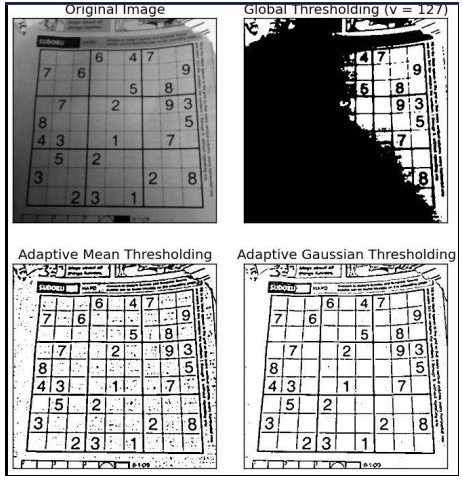

`cv.adaptiveThreshold(img, maxValue, adaptiveMethod, thresholdType, blockSize, C value)` adaptive specifies the method to compute threshold value. threshold types are the same thing as in simple thresholding. block size is basically the kernel size which openCV uses to calculate in the adaptive method. C value is an constant integer value that is subtracted from the result of adaptive method to fine tune the our threshold

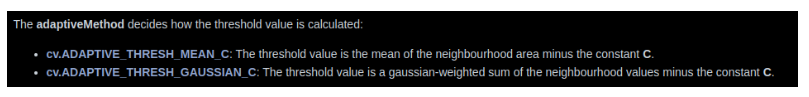

In [24]:
gray = cv.imread('./Resources/Photos/cats.jpg',cv.IMREAD_GRAYSCALE)
cv.imshow('gray scale image',gray)

# adaptive thresholding
adaptive_thresh = cv.adaptiveThreshold(gray, 255, cv.ADAPTIVE_THRESH_MEAN_C, cv.THRESH_BINARY, 11, 3)
cv.imshow('adaptive threshold image',adaptive_thresh)

cv.waitKey(0)
cv.destroyAllWindows()

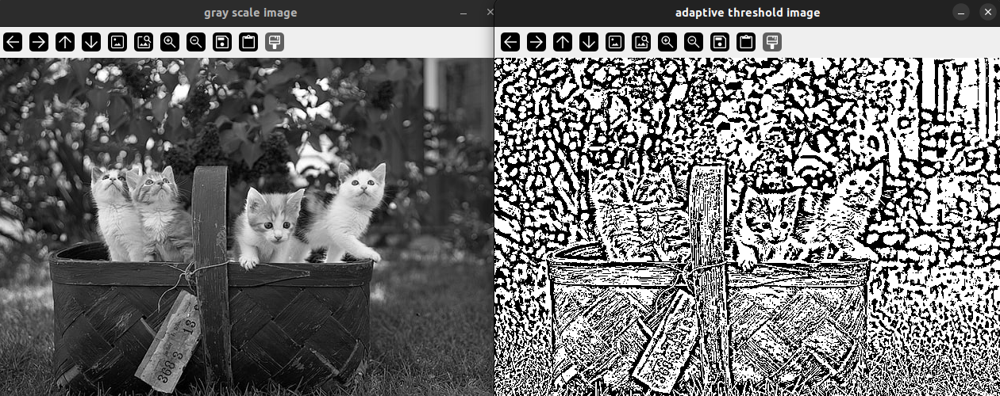

## Gradients and Edge Detection
gradients are a way to measure the change in pixel intensity in an image at a given direction. Gradients are a fundamental part of image processing and edge detection, and are used to extract information from an image.

<b>IMPORTANT NOTE:</b>   <br> If we want output datatype is cv.CV_8U or np.uint8 (i.e 8-bit unsigned integer ranging from 0-255). But there is a slight problem with that. Black-to-White transition is taken as Positive slope (it has a positive value) while White-to-Black transition is taken as a Negative slope (It has negative value). So when you convert data to np.uint8, all negative slopes are made zero since images pixels can't have negative values. In simple words, you miss that edge since the values negative values and values greater than 255 are clipped. Better option is to keep the output datatype to some higher forms, like cv.CV_16S, cv.CV_64F etc, take its absolute value and then convert back to cv.CV_8U.
### laplacian
Uses the Laplacian operator to identify edges in an image by detecting areas where the intensity changes rapidly i.e second derivative essentially<br>
`cv.Laplacian(img, data depth)` Data depth refers to the number of bits used to represent each pixel value in an image i.e determines the range of values a pixel can have. Data depth of -1 tells openCV to match the depth of input image<br>
### sobel
Looks for strong changes in the first derivative of image. In this the gradient is computed into two directions uses a pair of 3x3 convolution kernels to approximate the gradient of an image identifying edges by calculating the rate of intensity change in both horizontal and vertical directions<br>
`cv.Sobel(image src, data depth, derivative in x-direction, derivative in y-direction, ksizse=)` we can avoid mention kernel size or ksize in the code if need

In [25]:
gray = cv.imread('./Resources/Photos/cats.jpg',cv.IMREAD_GRAYSCALE)

# Laplacian method
lap = cv.Laplacian(gray, cv.CV_64F)
cv.imshow('64 bit floating point laplacian image',lap)
lap = np.uint8(np.absolute(lap))
cv.imshow('8 bit integer laplacian image',lap)

# sobel method
sobelx = cv.Sobel(gray, cv.CV_64F,1,0)
sobely = cv.Sobel(gray, cv.CV_64F,0,1)
cv.imshow('sobel x',sobelx)
cv.imshow('sobel y',sobely)

# combining the sobel image
combined_sobel = cv.bitwise_or(sobelx,sobely)
cv.imshow('combined sobel image',combined_sobel)

# canny edge detector
canny = cv.Canny(gray, 150,175)
cv.imshow('canny edge detector',canny)

cv.waitKey(0)
cv.destroyAllWindows()

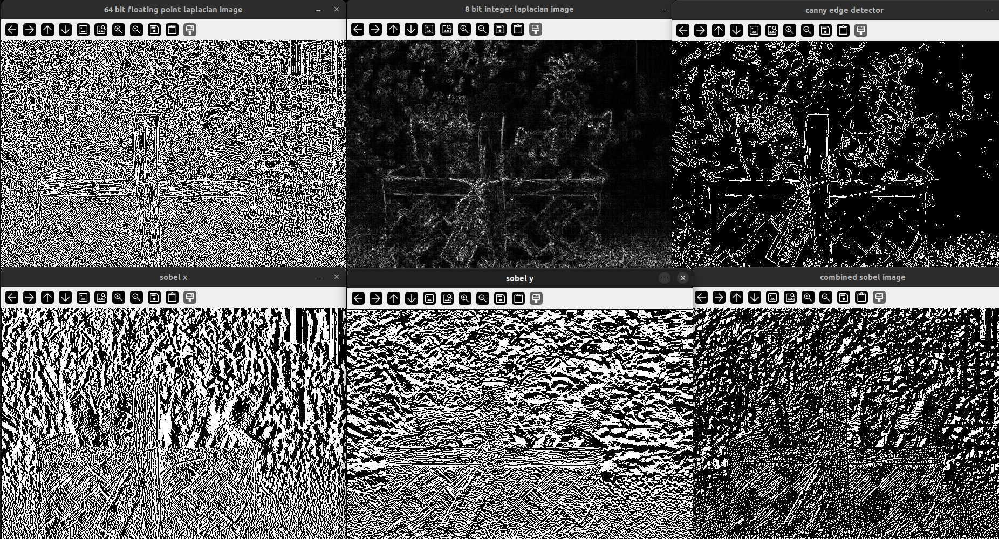

Like seen in the above GUI windows canny edge detector looks much much better. This is because canny is a much advanced multi-stage process. It actually uses sobel in one of its stage. Hence in a lot of projects its seen that canny is used in more advance cases we can see the use of sobel

Seeing sobel gradient detection in 8-bit unsigned integer image is also possible the same way it was done for laplacian.

We convert the processed image back to np.uint8 for display because most image display functions, like cv.imshow() in OpenCV, expect the input image to be in the 8-bit unsigned integer format (np.uint8) with pixel intensity values in the range of 0–255.

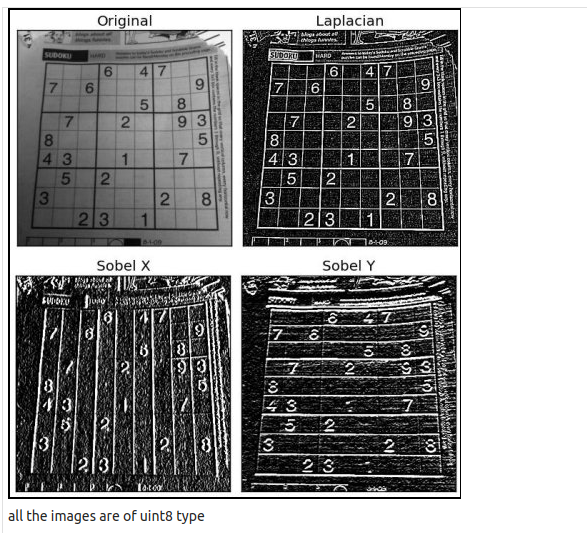

## Face Detection with Haar Cascades
Face detection is different from face recognition in the sense that face detection helps in the detection of any face instead of recognizing whose face it is.
It is performed using classifiers, a classifier is an algorithm that decide whether a given image is positive or negative i.e whether a face is present or not. OpenCV comes with a lot of pre-trained classifiers eg haar cascades, local binary patterns etc

Haar cascade doesn't use the skin tone and all to detect a image instead it sees the edges and tries determining if the image is of a face or not HENCE IT REQUIRES GRAYSCALE IMAGE AS INPUT

<li> First read the file and store it in a var (here haar_cascade) using <code>cv.CascadeClassifier</code>
<li> Detecting image using <code>haar_cascade.detectMultiScale(image, scaleFactor= , minNeighbours= )</code> and returning rectangular co-ordinates of the face to a var ( here faces_rect) in a list <b>format [(x,y,w,h),()..]</b>.  Scale Factor <b>reduces the size of image in small increments after each iteration</b>. as it looks for object at different scales cuz it looks for objects of vairous sizes as it can appear closer or further away, a value of 1.1 means the image is resized to 90% of its current size (1/1.1 ≈ 0.9) after each iteration. Haar Cascade operates with a base detection window size faces smaller than this won't be detected. Let’s assume an image is 300x300 pixels.
A face in this image is 15x15 pixels, which is 5% of the image width/height. If we resize the image to half its size (150x150 pixels), the face is now also resized to 7.5x7.5 pixels. However, relative to the new image size, this face now occupies 10% of the image width/height instead of 5%. Small face is now 7.5x7.5 pixels, but the detection window, which remains fixed in size, can now "see" this face better. <b>minNeighbors</b> parameter specifies the minimum number of overlapping detections (neighboring rectangles) required to confirm a face detection in a specific area.<br> <br>
When detectMultiScale scans an image:
<li>It slides a detection window (of varying sizes due to scaling) across the image at different positions and scales.</li>
<li>Each detection window evaluates whether a face is detected at that location. This evaluation may result in multiple "hits" (detections) for the same face but slightly offset due to noise or scale variations.</li>
<li>To ensure robustness, the algorithm groups nearby detections into clusters. The minNeighbors parameter sets the threshold for how many of these detections are needed to validate the presence of a face.
</li><br>

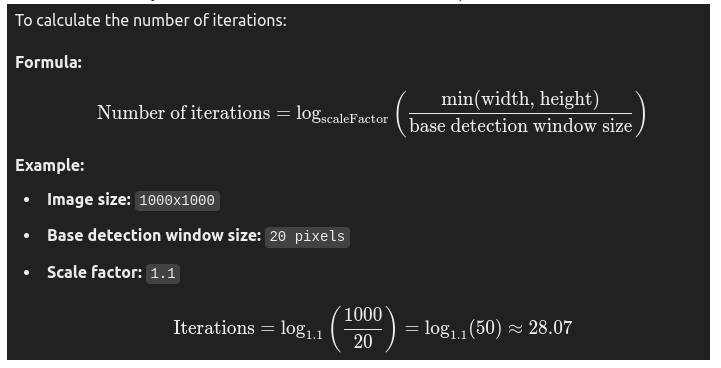

In [26]:
img = cv.imread('./Resources/Photos/lady.jpg')
gray = cv.imread('./Resources/Photos/lady.jpg',cv.IMREAD_GRAYSCALE)
cv.imshow('grayscale image of person',gray)

# reading the file and storing it in a variable 
haar_cascade = cv.CascadeClassifier('./haarcascades/haarcascade_frontalface_default.xml')

# detecting a face
faces_rect = haar_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=3)
print(f'No.of faes found in the image = {len(faces_rect)}')

# drawing a rectangle over the face using the co-ordinates in faces_rect
for (x,y,w,h) in faces_rect:
    cv.rectangle(img, (x,y), (x+w,y+h), (0,255,0), thickness=2)

cv.imshow('detected faces',img)

cv.waitKey(0)
cv.destroyAllWindows()

No.of faes found in the image = 1


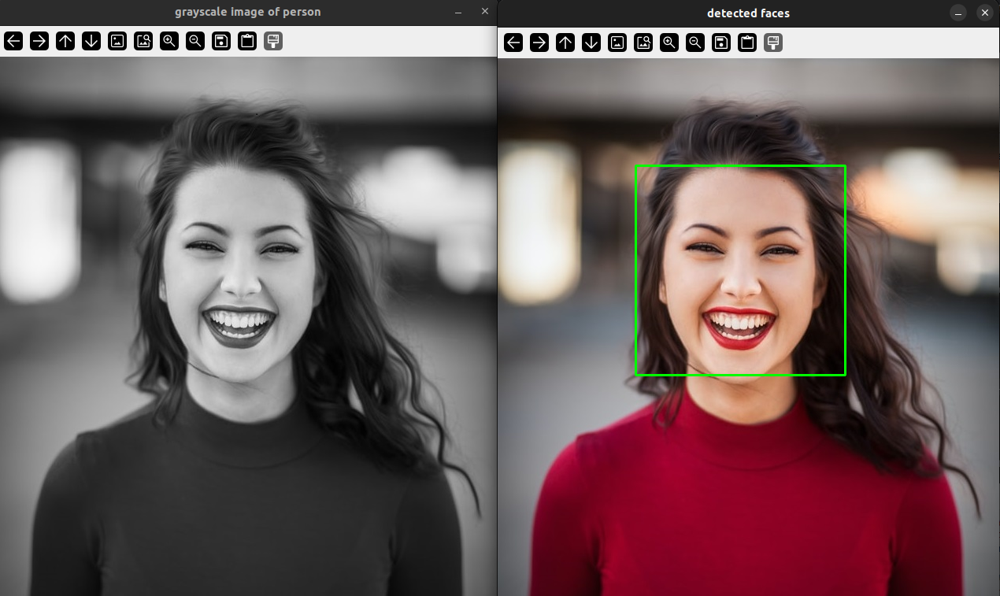<br><br>
Trying the same with a number of people

In [27]:
img = cv.imread('./Resources/Photos/group 2.jpg')
gray = cv.imread('./Resources/Photos/group 2.jpg',cv.IMREAD_GRAYSCALE)
cv.imshow('grayscale image of person',gray)

# reading the file and storing it in a variable 
haar_cascade = cv.CascadeClassifier('./haarcascades/haarcascade_frontalface_default.xml')

# detecting a face
faces_rect = haar_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=3)
print(f'No.of faes found in the image = {len(faces_rect)}')

# drawing a rectangle over the face using the co-ordinates in faces_rect
for (x,y,w,h) in faces_rect:
    cv.rectangle(img, (x,y), (x+w,y+h), (0,255,0), thickness=2)

cv.imshow('detected faces',img)

cv.waitKey(0)
cv.destroyAllWindows()

No.of faes found in the image = 7


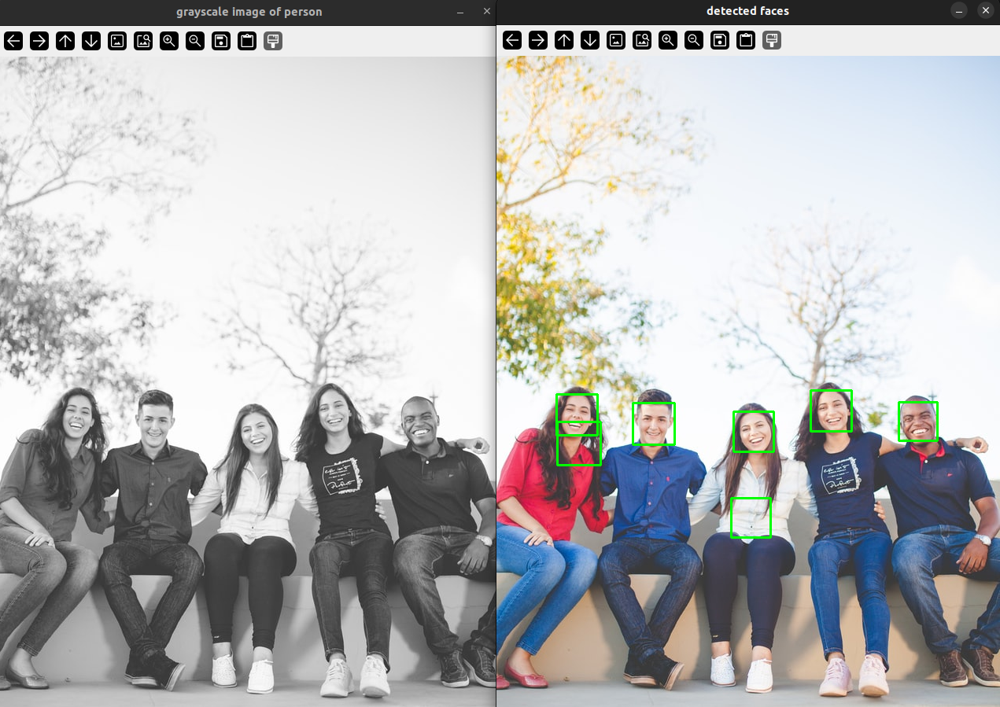
<br><br>
We see that openCV is getting it wrong and identifying wrong things as faces since haar cascades are sensitive to image noise i.e anything that looks like a faces is considered a face. To minimize we are increasing the `scale factor` and `minNeighbors`

In [28]:
img = cv.imread('./Resources/Photos/group 2.jpg')
gray = cv.imread('./Resources/Photos/group 2.jpg',cv.IMREAD_GRAYSCALE)
cv.imshow('grayscale image of person',gray)

# reading the file and storing it in a variable 
haar_cascade = cv.CascadeClassifier('./haarcascades/haarcascade_frontalface_alt.xml')

# detecting a face
faces_rect = haar_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=6)
print(f'No.of faces found in the image = {len(faces_rect)}')

# drawing a rectangle over the face using the co-ordinates in faces_rect
for (x,y,w,h) in faces_rect:
    cv.rectangle(img, (x,y), (x+w,y+h), (0,255,0), thickness=2)

cv.imshow('detected faces',img)

cv.waitKey(0)
cv.destroyAllWindows()

No.of faces found in the image = 5


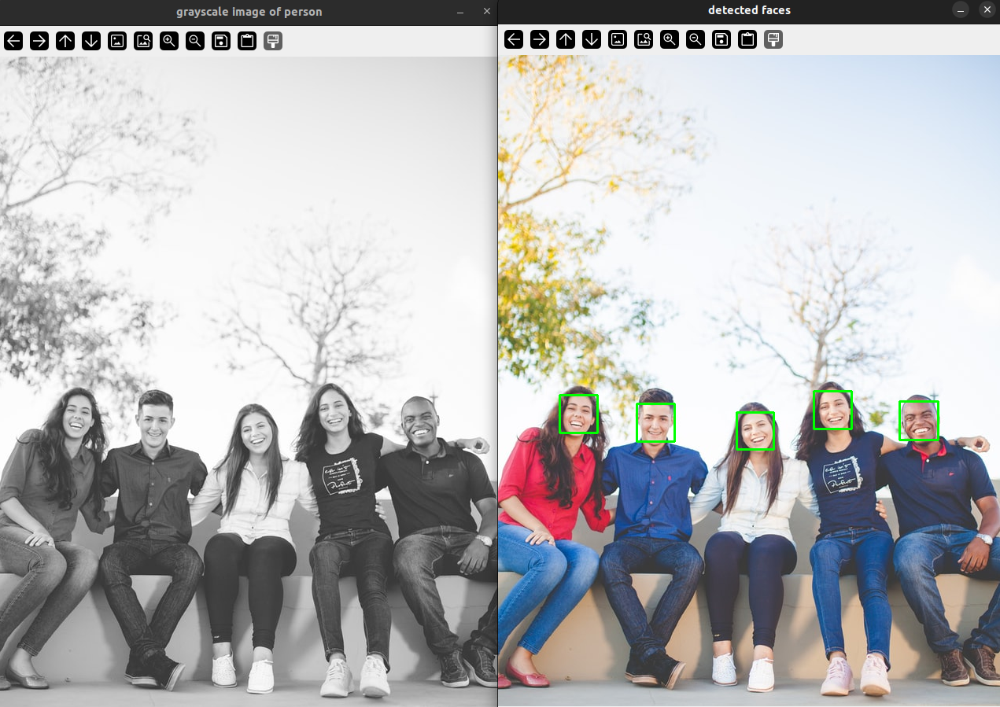
Notice that we have even changed the .xml script since the one's before were not properly trained or couldn't identify the face properly even after changing values for scaleFactor and minNeighbor

In [29]:
img = cv.imread('./Resources/Photos/group 1.jpg')
gray = cv.imread('./Resources/Photos/group 1.jpg',cv.IMREAD_GRAYSCALE)
cv.imshow('grayscale image of person',gray)

# reading the file and storing it in a variable 
haar_cascade = cv.CascadeClassifier('./haarcascades/haarcascade_frontalface_alt2.xml')

# detecting a face
faces_rect = haar_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=1)
print(f'No.of faces found in the image = {len(faces_rect)}')

# drawing a rectangle over the face using the co-ordinates in faces_rect
for (x,y,w,h) in faces_rect:
    cv.rectangle(img, (x,y), (x+w,y+h), (0,255,0), thickness=2)

cv.imshow('detected faces',img)

cv.waitKey(0)
cv.destroyAllWindows()

No.of faces found in the image = 23


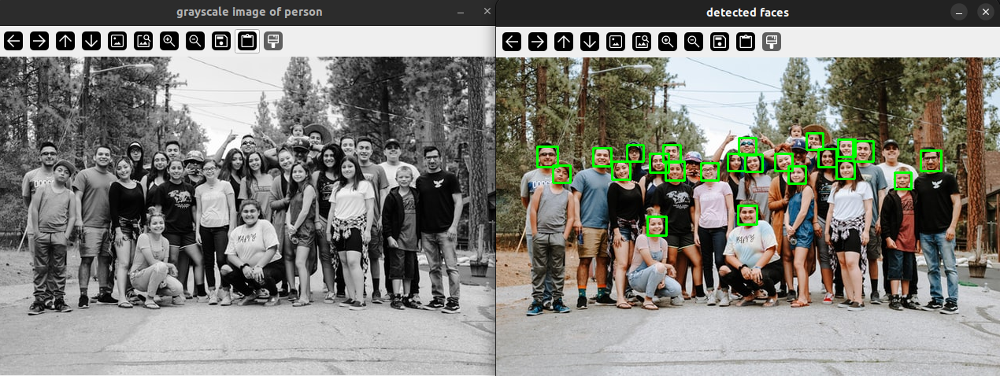<br><br>
We still can't recognize faces with noise as seen above that one of the person is not recognized, hence we don't usually use haar-cascades for advance computer vision projects

## Face Recognition with openCV
We are using openCV's built in facial recognizer

In [30]:
import os

# empty list
people = []

for i in os.listdir('./Resources/Faces/train'):
    people.append(i)

dir = './Resources/Faces/train'
haar_cascade = cv.CascadeClassifier('./haarcascades/haarcascade_frontalface_alt2.xml')

# to add data to traininig set
features = []       # image array of faces
labels = []         # whose face does the image belong to

def create_train():
    # to loop over the folders adding their destination to path for entrance
    for person in people:
        path = os.path.join(dir,person)
        label = people.index(person)    # finds index of the first occurence

        # to loop over image in the folder
        for img in os.listdir(path):
            img_path = os.path.join(path,img)

            img_array = cv.imread(img_path)
            gray_img = cv.cvtColor(img_array,cv.COLOR_BGR2GRAY)
            
            faces_rect = haar_cascade.detectMultiScale(gray_img, scaleFactor=1.1, minNeighbors=4)
            for (x,y,w,h) in faces_rect:
                faces_roi = gray_img[y:y+h, x:x+w]
                features.append(faces_roi)
                labels.append(label)         # label in index useful to reduce strain by having a maping between strings and numerical value

create_train()
print(f'length of features = {len(features)}')
print(f'length of labels = {len(labels)}')

# instantiation of  face recognizer
face_recognizer = cv.face.LBPHFaceRecognizer_create()

# converting features and labels to numpy arrays for training
features = np.array(features, dtype = 'object')
labels = np.array(labels)

# training the recognizer
face_recognizer.train(features,labels)

# creating a YML source file to save the trained model
face_recognizer.save('face_trained.yml')

# saving the array into a file
np.save('features.npy',features)
np.save('labels.npy',labels)

length of features = 83
length of labels = 83


In [31]:
import os

people = []

for i in os.listdir('./Resources/Faces/train'):
    people.append(i)
    
# using previously trained model to recognize faces in other files
haar_cascade = cv.CascadeClassifier('./haarcascades/haarcascade_frontalface_alt2.xml')

features = np.load('features.npy', allow_pickle = True)
labels = np.load('labels.npy')

face_recognizer = cv.face.LBPHFaceRecognizer_create()
face_recognizer.read('face_trained.yml')

img = cv.imread('./Resources/Faces/val/madonna/1.jpg')
gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
cv.imshow('person',gray)

# detect face
faces_rect = haar_cascade.detectMultiScale(gray, 1.1, 4)
for (x,y,w,h) in faces_rect:
    faces_roi = gray[y:y+h,x:x+w]

    label, confidence = face_recognizer.predict(faces_roi)
    print(f'label = {people[label]} with confidence of {confidence}')

    cv.putText(img, str(people[label]), (20,20), cv.FONT_HERSHEY_COMPLEX, 1.0, (0,255,0), thickness = 1)
    cv.rectangle(img , (x,y), (x+w, y+h), (0,255,0), thickness = 2)

cv.imshow('detected image',img)

cv.waitKey(0)
cv.destroyAllWindows()

label = Jerry Seinfield with confidence of 110.75711584602911


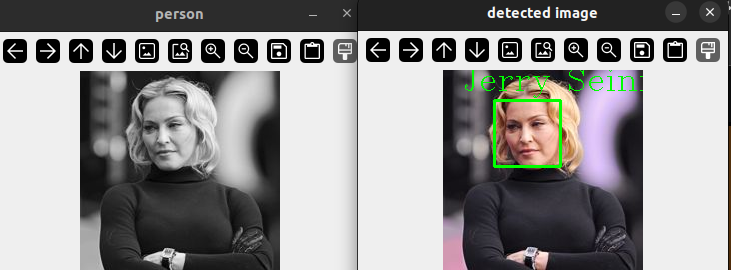<br><br>

We see that the built in face recognizer by openCV isn't that good as it recognizes madonna as jerry seinfield with a confidence of 110